In [91]:
import torch
import torch.utils.data
import torch.nn as nn
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [104]:
data_root = "/home/chess/Documents/Code/Learning/CV/ComputerVision/data/anime"
workers = 2
batch_size = 128
image_size = 64
nc = 3
nz = 100 # size of latent vectors
ngf = 64 # feature map of generator
ndf = 64 # feature map of generator
num_epochs = 10
lr = 0.0002 # learning rate
beta1 = 0.5
ngpu = 1

### creating the dataset

In [93]:



dataset = torchvision.datasets.ImageFolder(data_root,
                                           transform=torchvision.transforms.Compose([
                                               torchvision.transforms.Resize(image_size),
                                               torchvision.transforms.CenterCrop(image_size),
                                               torchvision.transforms.ToTensor(),
                                               torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                           ]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True,
                                         num_workers=workers)

In [94]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

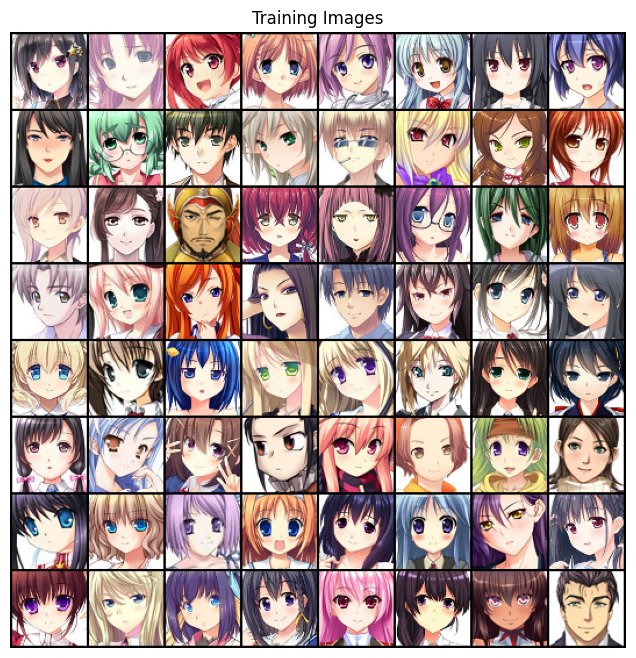

In [107]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

### weight initialization

In [95]:
def weight_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [96]:
# Generator
class Generator(nn.Module):
    def __init__(self, ngpu, ngf, nz, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)


In [97]:
# initialise the generator 
netG = Generator(ngpu, ngf, nz, nc).to(device)
# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))
# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weight_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [98]:
# Discriminator
class Discriminator(nn.Module):
    def __init__(self, ngpu, ndf, nz, nc):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [99]:
netD = Discriminator(ngpu, ndf, nz, nc).to(device)
netD.apply(weight_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [100]:
# Loss and optimizer initialization

criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))


### Training

In [105]:
# Training Loop
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training loop ...")
for epochs in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        # Train with all real batches
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Forwared pass on real batch on Discriminator
        output = netD(real_cpu).view(-1)
        # calculate the loss on all real batch
        errD_real = criterion(output, label)
        errD_real.backward()

        D_x = output.mean().item()
        
        # Train with all fake batches
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        
        # Generate fake images with Generator
        fake = netG(noise)

        label.fill_(fake_label)

        # classify all fake images with D
        output = netD(fake.detach()).view(-1)
        # calculate D's loss on all fake images
        errD_fake = criterion(output, label)
        errD_fake.backward()

        D_G_z1 = output.mean().item()

        # Error of D as sum of fake error and real error
        errD = errD_real + errD_fake
        optimizerD.step()

        # Update G network: maximize log(D(G(z)))
        netG.zero_grad()
        label.fill_(real_label)

        output = netD(fake).view(-1)
        
        # calculating G's loss based on output
        errG = criterion(output, label)
        errG.backward()

        D_G_z2 = output.mean().item()

        optimizerG.step()

        # output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epochs, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epochs == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training loop ...
[0/10][0/169]	Loss_D: 0.7703	Loss_G: 7.6838	D(x): 0.9419	D(G(z)): 0.4529 / 0.0009
[0/10][50/169]	Loss_D: 0.4393	Loss_G: 4.4278	D(x): 0.9098	D(G(z)): 0.2583 / 0.0175
[0/10][100/169]	Loss_D: 1.1280	Loss_G: 8.9133	D(x): 0.9221	D(G(z)): 0.5863 / 0.0003
[0/10][150/169]	Loss_D: 0.9321	Loss_G: 7.9237	D(x): 0.9212	D(G(z)): 0.5062 / 0.0007
[1/10][0/169]	Loss_D: 0.4846	Loss_G: 6.9867	D(x): 0.8967	D(G(z)): 0.2715 / 0.0015
[1/10][50/169]	Loss_D: 1.4447	Loss_G: 5.3937	D(x): 0.3698	D(G(z)): 0.0021 / 0.0101
[1/10][100/169]	Loss_D: 0.5134	Loss_G: 3.0447	D(x): 0.7040	D(G(z)): 0.0508 / 0.0888
[1/10][150/169]	Loss_D: 0.5735	Loss_G: 6.2332	D(x): 0.8275	D(G(z)): 0.2537 / 0.0030
[2/10][0/169]	Loss_D: 1.3009	Loss_G: 7.5330	D(x): 0.4446	D(G(z)): 0.0030 / 0.0013
[2/10][50/169]	Loss_D: 0.2852	Loss_G: 4.3154	D(x): 0.8027	D(G(z)): 0.0178 / 0.0227
[2/10][100/169]	Loss_D: 0.7313	Loss_G: 6.7141	D(x): 0.8538	D(G(z)): 0.3608 / 0.0022
[2/10][150/169]	Loss_D: 0.6872	Loss_G: 5.7422	D(x): 0.8440

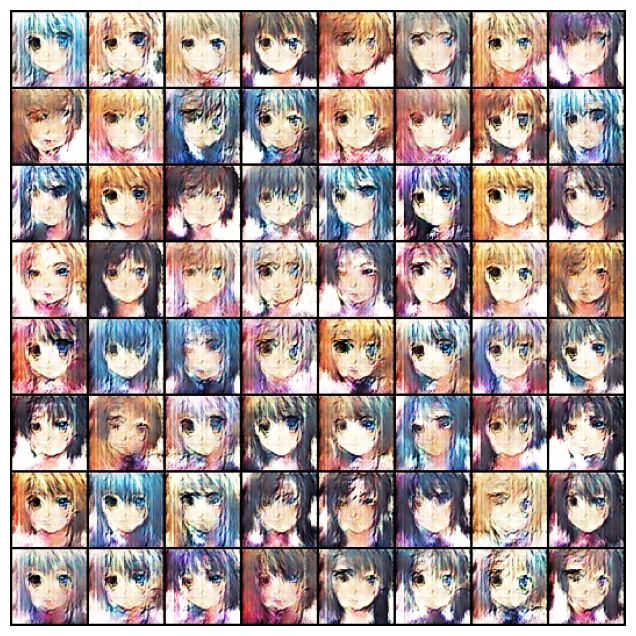

In [106]:
# visualize the output progression
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [109]:
# saving the model
model_path = "../models/dcgan.pth"
torch.save(netG.state_dict(), model_path)

torch.Size([8, 3, 64, 64])


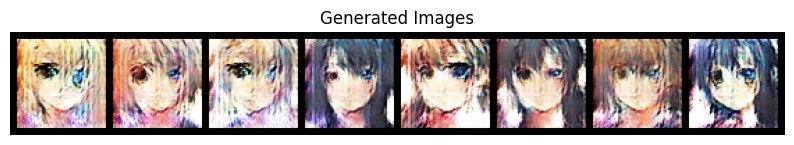

In [132]:
# Run the model
generator = Generator(1, 64, 100, 3).to(device)
generator.load_state_dict(torch.load("../models/dcgan.pth"))

noise = torch.randn(8, nz, 1, 1, device=device)
output = generator(noise)
print(output.shape)
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(output.to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))
plt.show()